This exercise session is about identifying the fundamental frequency of a speech signal using the time domain
representation. The approach addressed in this exercise requires the signal to be split into overlapping blocks.
Speech signals are often analyzed in such short time frames and therefore, you will write a Python function
which performs this step. This function will also be useful in the following exercise sessions.



For solving this exercise, basic knowledge about Python is required. Before you start solving the exercises, you
need to download and extract Exercise1.zip from STiNE which contains the wave files needed for this exercise.
If applicable, the exercises should be performed for both signals.

# Fundamental frequency estimation by eye

In [56]:
# imports and settings

from scipy.io.wavfile import read
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import mpld3
import sounddevice as sd
%matplotlib inline
mpld3.enable_notebook()
matplotlib.rcParams['figure.figsize'] = [12, 5]

a) Load the wave files from the archive (e.g. using read from scipy.io.wavfile ).

In [57]:
fs1, samples1 = read('speech1.wav')
fs2, samples2 = read('speech2.wav')

\begin{itemize}
    \item What is the sampling frequency of the signals?
\end{itemize}

\textcolor{blue}{Die Abtastrate ist bei speech1.wav {{fs1}} Hz und bei speech2.wav {{fs2}}Hz.}

b) Plot the signal as a function of time [s]. For this, create a vector which contains the time instants for each
sample. For plotting, you can employ the plot command from matplotlib.pyplot

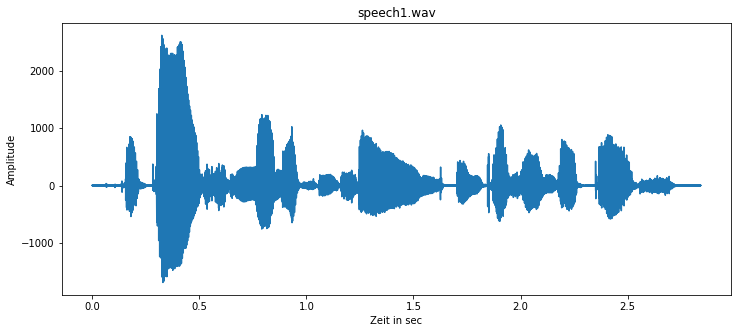

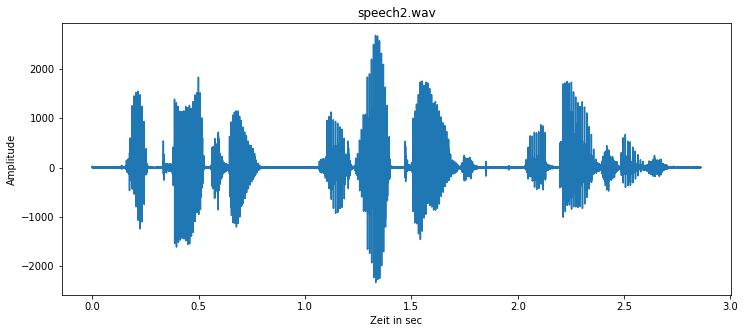

In [58]:
time_domain_1 = np.arange(len(samples1)) / fs1
time_domain_2 = np.arange(len(samples2)) / fs2

fig_speech1, ax_speech1 = plt.subplots()
ax_speech1.plot(time_domain_1, samples1)
ax_speech1.set(title='speech1.wav', xlabel='Zeit in sec', ylabel='Amplitude')

fig_speech2, ax_speech2 = plt.subplots()
ax_speech2.plot(time_domain_2, samples2)
ax_speech2.set(title='speech2.wav', xlabel='Zeit in sec', ylabel='Amplitude');


\begin{itemize}
    \item Identify the voiced, unvoiced and silence regions in the waveform. Which criteria did you use to distinguish between the three signal types?
\end{itemize}

\textcolor{blue}{ Quasi-periodische Zeitabschnitte sind stimmhafte, rauschige Zeitabschnitte sind stimmlose und Zeitabschnitte mit Amplituden nahe 0 sind Ruhepausen.}

Pick a single voiced segment from both signals and estimate the fundamental frequency from the waveform.
The results measured this way may be helpful to verify the outcomes of the fundamental frequency estimator
in part 3 of the exercise.
\begin{itemize}
\item Plot your selected segments and describe your procedure. Judging based on the measured fundamental
frequencies, do the signals originate rather from a male or a female speaker? Verify your findings by
listening to the signals! (In the following exercises you should be able to listen to audio data contained
in numpy (abbreviated with np ) arrays. For this you could use the play function from sounddevice .)
\end{itemize}

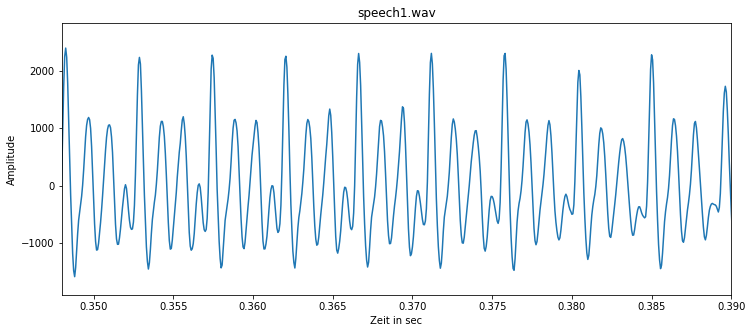

In [59]:
voiced_start1, voiced_end1 = 0.3, 0.5
voiced_start_index1, voiced_end_index1 = (int(time * fs1) for time in (voiced_start1, voiced_end1))
segment_start1, segment_end1, periodic_number1 = 0.348, 0.39, 9

# speech1.wav stimmhafter Laut abspielen
# sd.play(samples1[voiced_start_index1:voiced_end_index1], fs1)

estimate_fundamental_frequency_1 = int(9 / (segment_end1 - segment_start1))

# speech1 stimmhafter Segment mit 9 Wiederholungen betrachten
ax_speech1.set(xlim=(segment_start1, segment_end1))
fig_speech1

\textcolor{blue}{ 
    Vorgehen:
    \begin{itemize}
        \item In einen stimmhaften Laut reinzoomen
        \item Solange reinzoomen bis Wiederholungen (erkennbar anhand der Peaks) abzählbar sind.
        \item Anzahl der Wiederholung durch das Zeitfenster teilen
    \end{itemize}
    Die geschätzte Grundfrequenz von speech1.wav ist {{estimate_fundamental_frequency_1}}.}

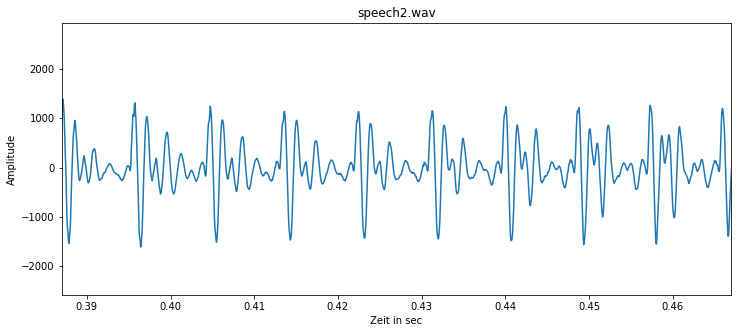

In [60]:
voiced_start2, voiced_end2 = 0.38, 0.52
voiced_start_index2, voiced_end_index2 = (int(time * fs2) for time in (voiced_start2, voiced_end2))
segment_start2, segment_end2, periodic_number2 = 0.387, 0.467, 9

# speech1.wav stimmhafter Laut abspielen
# sd.play(samples2[voiced_start_index2:voiced_end_index2], fs2)

estimate_fundamental_frequency_2 = int(9 / (segment_end2 - segment_start2))

# speech1 stimmhafter Segment mit 9 Wiederholungen betrachten
ax_speech2.set(xlim=(segment_start2, segment_end2))
fig_speech2

\textcolor{blue}{ Die geschätzte Grundfrequenz von speech2.wav ist {{estimate_fundamental_frequency_2}}.}

# Block processing

Write your own Python function that splits the time domain signal into overlapping frames. A prototype for this
function could look like the following example assuming that the loaded signal is stored in the vector v_signal .

def my_windowing ( v_signal : np . ndarray , sampling_rate : int , frame_length : int ,
frame_shift : int ) -> [ np . ndarray ( m_frames ) , np . ndarray ( v_time_frame ) ]

The parameter sampling_rate is the sampling rate in Hz, while frame_length and frame_shift should contain
the frame length and the frame shift in units of milliseconds. The extracted segments are stored in the columns
of the matrix m_frames . The elements of the vector v_time_frame correspond to the time instants around which
the frames are centered.

In [61]:
def my_windowing(v_signal, sampling_rate, frame_length, frame_shift):
    """
    v_signal: np.ndarray
    sampling_rate: int (in Hertz)
    frame_length: int (in Millisekunden)
    frame_shift: int (in Millisekunden)
    
    m_frames: np.ndarray
    v_time_frames: np.ndarray (jeweils in Sekunden)
    """
    millisec_in_sec = 1e-3
    length_number = int(frame_length * millisec_in_sec * sampling_rate)
    shift_number = int(frame_shift * millisec_in_sec * sampling_rate)
    frame_number = (len(v_signal) - (length_number - shift_number)) // shift_number
    frames = [v_signal[index:index + length_number] 
              for index in np.arange(frame_number) * shift_number]
    times = [(frame_start + frame_length / 2) * millisec_in_sec
             for frame_start in np.arange(frame_number) * frame_shift]
    return np.array(frames), np.array(times)

In [62]:
test_signal = [0, 1, 2, 3, 4, 5, 6, 7]

# Test von hintereinanderfolgenden Frames
print(*my_windowing(test_signal, sampling_rate=1, frame_length=3000,
                    frame_shift=3000), sep=" with ")

# Test mit Überlappung
print(*my_windowing(test_signal, sampling_rate=1, frame_length=3000,
                    frame_shift=2000), sep=" with ")

# Test mit Abstand
print(*my_windowing(test_signal, sampling_rate=1, frame_length=2000,
                    frame_shift=3000), sep=" with ")

[[0 1 2]
 [3 4 5]] with [1.5 4.5]
[[0 1 2]
 [2 3 4]
 [4 5 6]] with [1.5 3.5 5.5]
[[0 1]
 [3 4]
 [6 7]] with [1. 4. 7.]


\begin{itemize}
    \item In how many frames can the input signal be split? Try to find a formula for computing the number of
frames from the signal length, frame length and frame shift.
\end{itemize}

\textcolor{blue}{ 
 $$ number\_of\_frames = \left \lfloor \frac{signal\_length - (frame\_length - frame\_shift)}{frame\_shift} \right \rfloor$$}

# Fundamental frequency estimator

In this part of the exercise a fundamental frequency estimator will be implemented which operates on the
overlapping frames from the previous exercise. The estimator is based on the autocorrelation function (ACF)
which will be computed on every frame. This function indicates how similar a block is to a shifted version of
itself. This way the time period between the glottal impulses can be identified which allows for estimating the
fundamental frequency. In order to give you an idea on how the ACF will look like in a voiced segment, an
example is shown in Figure 1.

a) Split the signal into 32 ms frames with a frame shift of 16 ms using your function from Section 2.

In [63]:
frame_length, frame_shift = 32, 16
m_frames1, v_time_frame1 = my_windowing(samples1, fs1, frame_length, frame_shift)
m_frames2, v_time_frame2 = my_windowing(samples2, fs2, frame_length, frame_shift)

b) Compute the ACF for every frame using np.convolve which computes the convolution. Think about how the
indices of the resulting ACF correspond to the lag τ

In [64]:
acf1 = [np.convolve(m_frame, m_frame[:-1]) / frame_length for m_frame in m_frames1]
acf2 = [np.convolve(m_frame, m_frame[:-1]) / frame_length for m_frame in m_frames2]

c) Remove the lower half of the ACF which corresponds to the negative lags.

In [65]:
positiv_acf1 = [acf_frame[len(acf_frame)//2:] for acf_frame in acf1]
positiv_acf2 = [acf_frame[len(acf_frame)//2:] for acf_frame in acf2]

d) Estimate the fundamental frequency by selecting the maximum in the remaining part of the ACF. The search
range should be limited to frequencies between 80 Hz and 400 Hz, so the maximum at τ = 0 ms will not be
identified as period length. Remember that the detected maximum corresponds to the period length!

In [70]:
min_fundamental_period = 1/400
max_fundamental_period = 1/80
index_start_search = int(min_fundamental_period * fs1)
index_end_search = int(max_fundamental_period * fs1)
max_indicies1 = [np.argmax(acf_frame[index_start_search:index_end_search]) + index_start_search
                for acf_frame in positiv_acf1]
fundamental_frequencies1 = [int(fs1 / index) for index in max_indicies1]

max_indicies2 = [np.argmax(acf_frame[index_start_search:index_end_search]) + index_start_search
                for acf_frame in positiv_acf2]
fundamental_frequencies2 = [int(fs2 / index) for index in max_indicies2]

d) Plot the time course of the estimated fundamental frequencies together with the time domain signal.

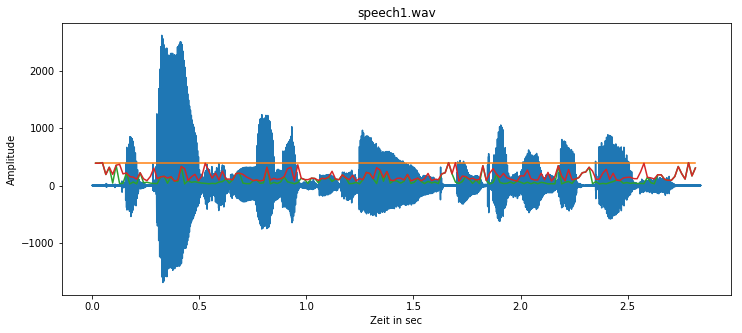

In [71]:
ax_speech1.autoscale()
ax_speech1.plot(v_time_frame1, fundamental_frequencies1)
fig_speech1

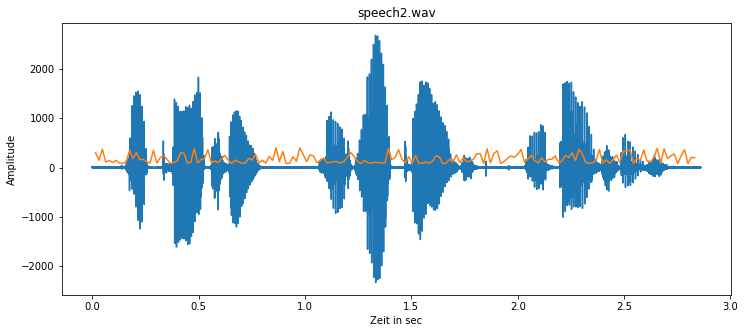

In [52]:
ax_speech2.autoscale()
ax_speech2.plot(v_time_frame2, fundamental_frequencies2)
fig_speech2

\begin{itemize}
    \item In which parts of the signal does the fundamental frequency estimator give reasonable results and why?
    Do the estimated frequencies match your findings from the first exercise in Section 1?
\end{itemize}

\textcolor{blue}{An den Stellen, wo stimmhafte Laute auftreten, ist die geschätzte Grundfrequenz korrekter. Ab und zu wird der Wert getroffen}